In [1]:
!pip install pillow transformers
!pip install opencv-python-headless
!pip install controlnet_aux
!pip install diffusers
!pip install torch
!pip install accelerate

In [2]:
import random

import requests
import torch
from controlnet_aux import ZoeDetector
from PIL import Image, ImageOps

from diffusers import (
    AutoencoderKL,
    ControlNetModel,
    StableDiffusionXLControlNetPipeline,
    StableDiffusionXLInpaintPipeline,
)

/home/ec2-user/anaconda3/envs/pytorch_p310/lib/python3.10/site-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(


In [3]:
def scale_and_paste(original_image):
    aspect_ratio = original_image.width / original_image.height

    if original_image.width > original_image.height:
        new_width = 1024
        new_height = round(new_width / aspect_ratio)
    else:
        new_height = 1024
        new_width = round(new_height * aspect_ratio)

    resized_original = original_image.resize((new_width, new_height), Image.LANCZOS)
    white_background = Image.new("RGBA", (1024, 1024), "white")
    x = (1024 - new_width) // 2
    y = (1024 - new_height) // 2
    white_background.paste(resized_original, (x, y), resized_original)

    return resized_original, white_background

In [5]:
image_path = "necklace1 (1).png"
original_image = Image.open(image_path).convert("RGBA")
resized_img, white_bg_image = scale_and_paste(original_image)

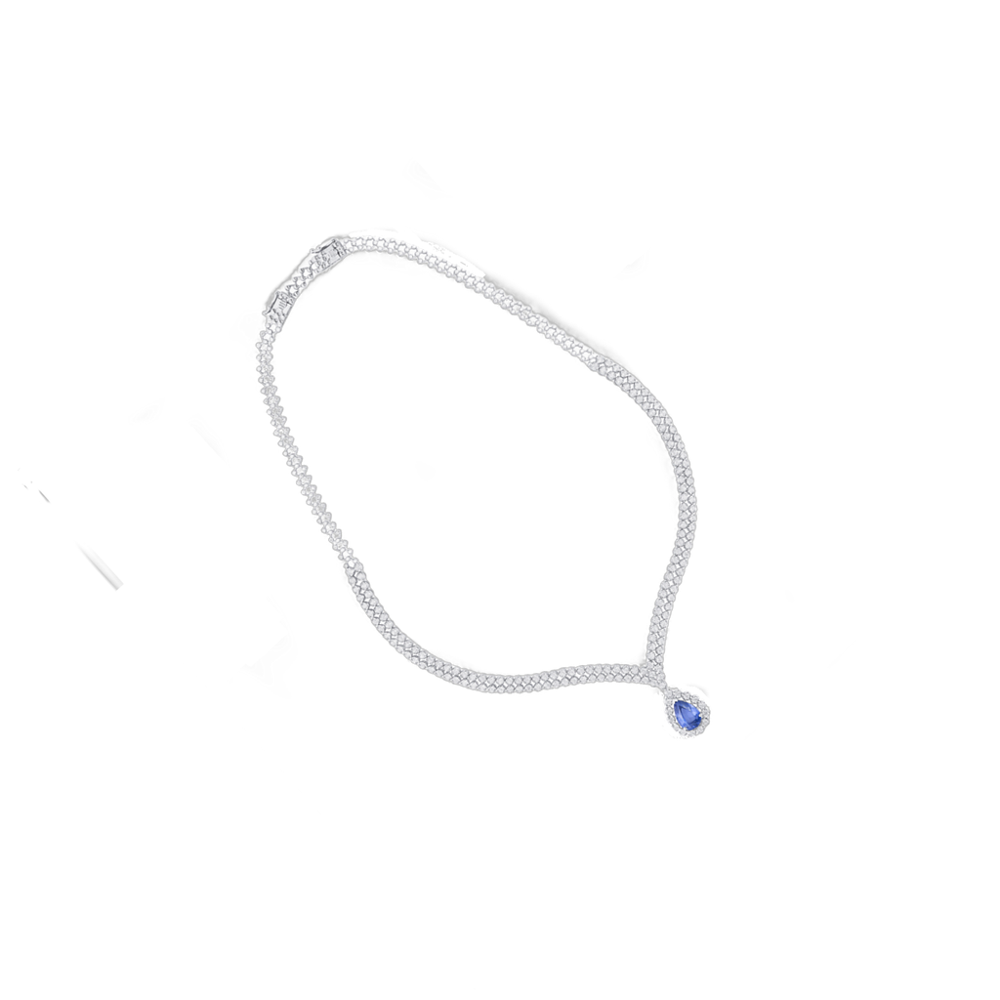

In [6]:
resized_img

ZoeD_M12_N.pt:   0%|          | 0.00/1.44G [00:00<?, ?B/s]

/home/ec2-user/anaconda3/envs/pytorch_p310/lib/python3.10/site-packages/torch/functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1706743807255/work/aten/src/ATen/native/TensorShape.cpp:3549.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


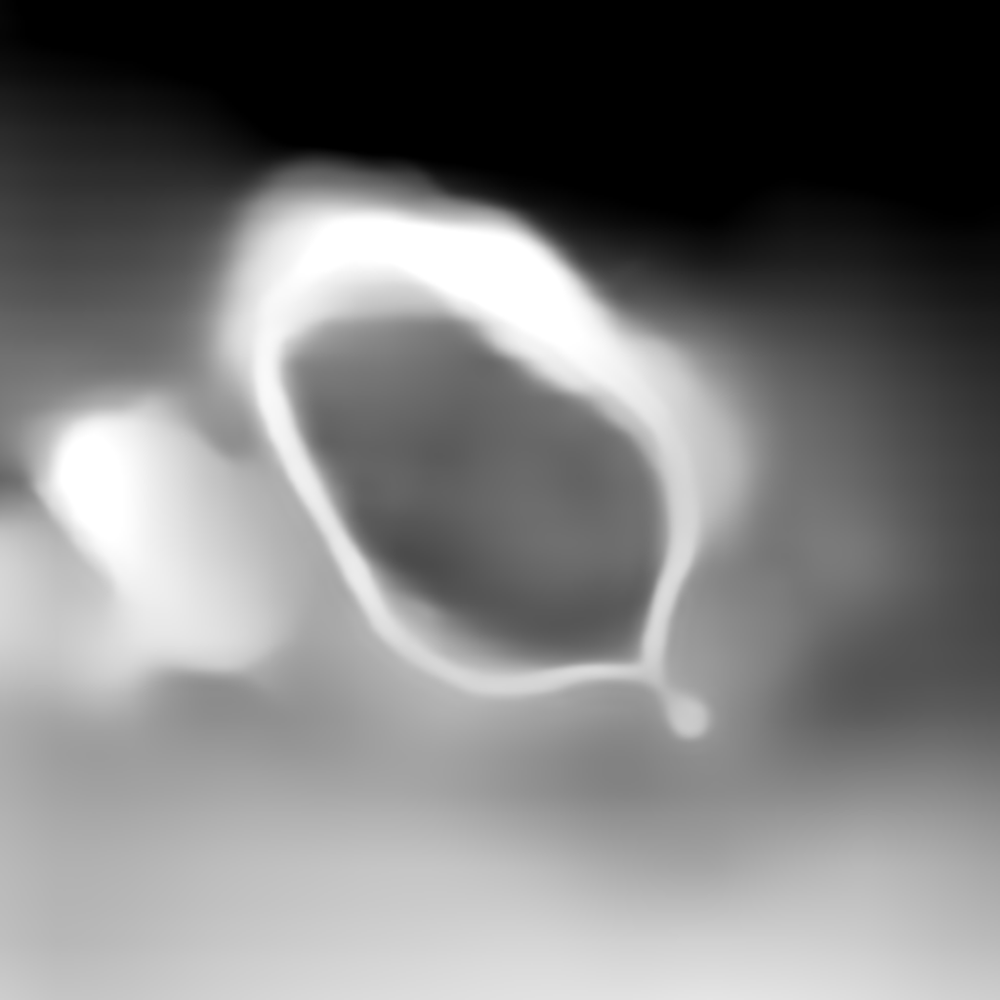

In [7]:
zoe = ZoeDetector.from_pretrained("lllyasviel/Annotators")
image_zoe = zoe(white_bg_image, detect_resolution=512, image_resolution=1024)
image_zoe

In [8]:
controlnets = [
    ControlNetModel.from_pretrained(
        "destitech/controlnet-inpaint-dreamer-sdxl", torch_dtype=torch.float16, variant="fp16"
    ),
    ControlNetModel.from_pretrained(
        "diffusers/controlnet-zoe-depth-sdxl-1.0", torch_dtype=torch.float16
    ),
]
vae = AutoencoderKL.from_pretrained("madebyollin/sdxl-vae-fp16-fix", torch_dtype=torch.float16).to("cuda")
pipeline = StableDiffusionXLControlNetPipeline.from_pretrained(
    "SG161222/RealVisXL_V4.0", torch_dtype=torch.float16, variant="fp16", controlnet=controlnets, vae=vae
).to("cuda")

config.json:   0%|          | 0.00/1.23k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/2.50G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.28k [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/2.50G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/631 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/577 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/560 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/474 [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [21]:
def generate_image(prompt, negative_prompt, inpaint_image, zoe_image, seed: int = None):
    if seed is None:
        seed = random.randint(0, 2**32 - 1)

    generator = torch.Generator(device="cpu").manual_seed(seed)

    image = pipeline(
        prompt,
        negative_prompt=negative_prompt,
        image=[inpaint_image, zoe_image],
        guidance_scale=7.5,
        num_inference_steps=50,
        generator=generator,
        controlnet_conditioning_scale=[0.5, 0.8],
        control_guidance_end=[0.9, 0.6],
    ).images[0]

    return image

  0%|          | 0/25 [00:00<?, ?it/s]

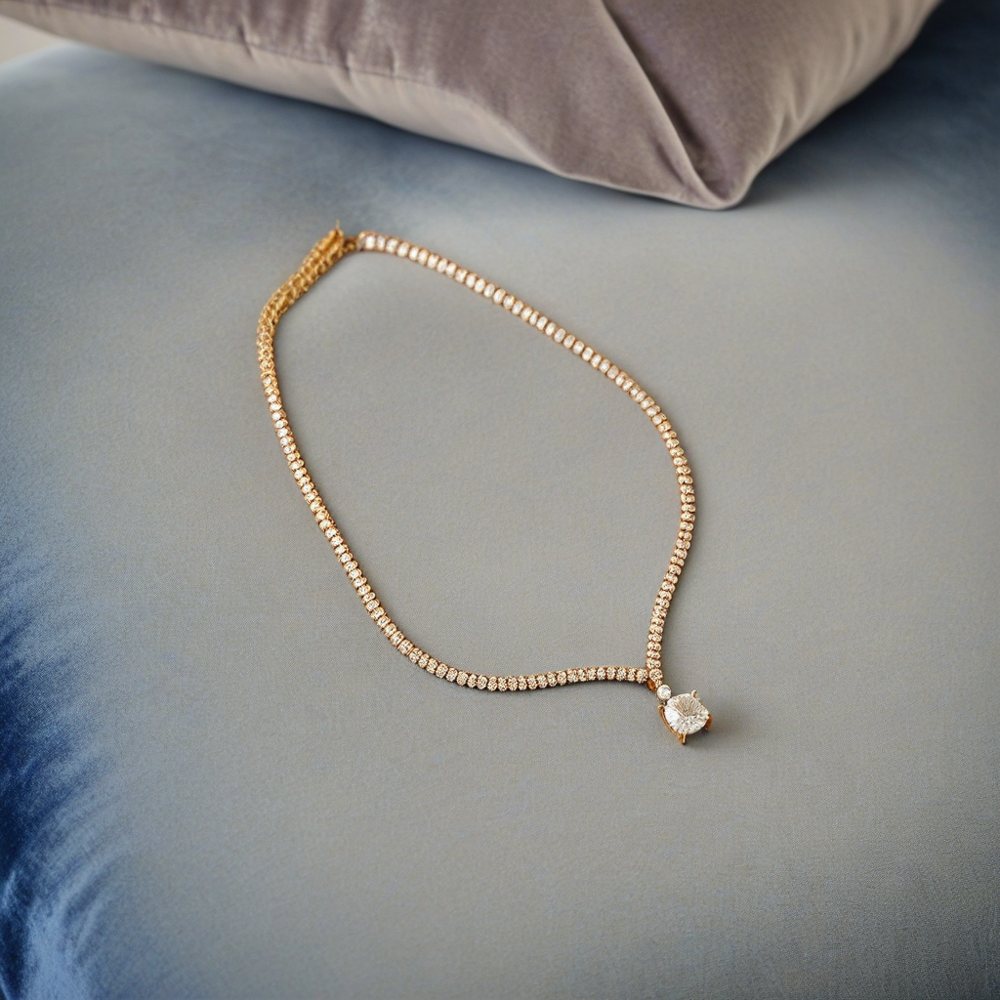

In [10]:
prompt= "Elegant still life of a diamond necklace resting on a rich blue velvet cushion. Soft, warm lighting emphasizes the necklace's sparkle and the cushion's luxurious texture. Simple, refined background with muted tones enhances focus on the jewelry, creating a sophisticated and timeless atmosphere."
negative_prompt = "No bright colors, busy patterns, extra objects, harsh lighting, reflections, human figures, animals, or outdoor elements. Avoid clutter and distractions."

temp_image = generate_image(prompt, negative_prompt, white_bg_image, image_zoe)
temp_image

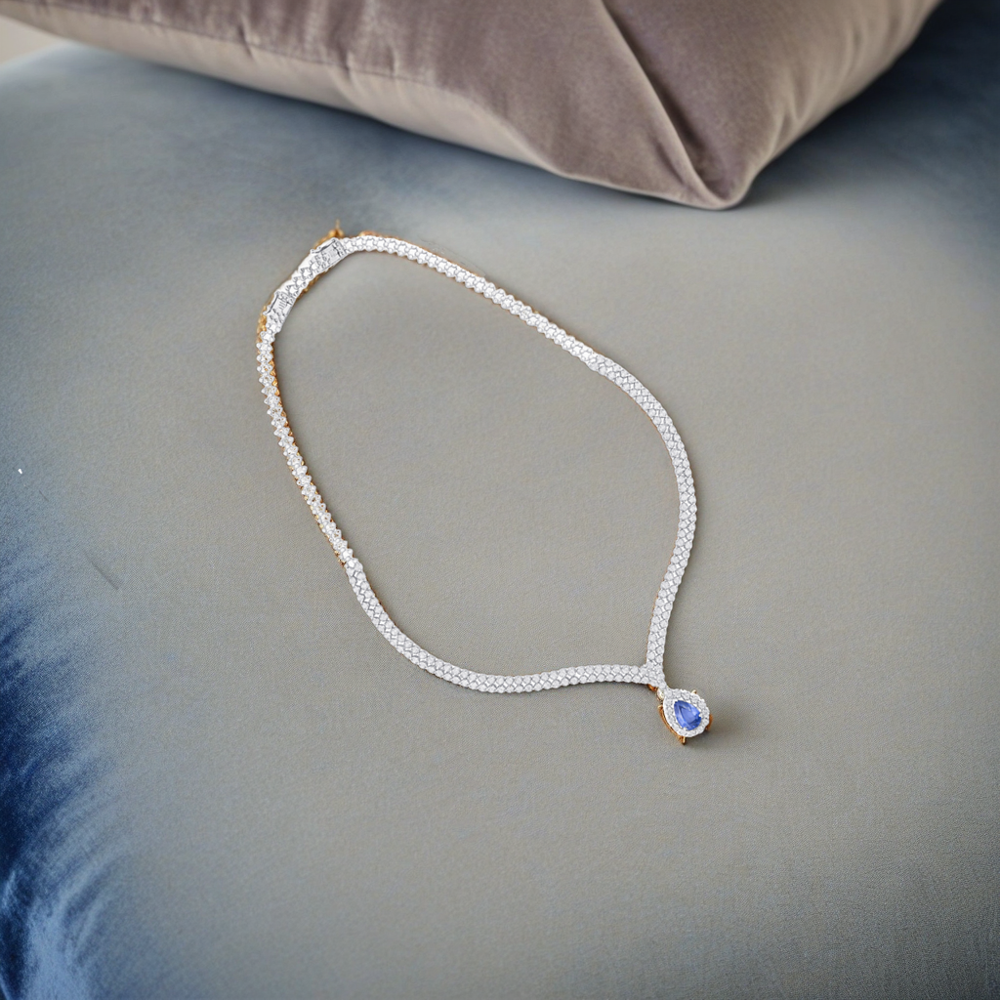

In [11]:
x = (1024 - resized_img.width) // 2
y = (1024 - resized_img.height) // 2
temp_image.paste(resized_img, (x, y), resized_img)
temp_image

## Refiner 

In [5]:
# !pip install transformers
# !pip install Pillow
# !pip install requests
# !pip install diffusers
# !pip install accelerate

In [6]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, DiffusionPipeline
from diffusers import StableDiffusion3Pipeline
import torch
from diffusers import UniPCMultistepScheduler
from diffusers.utils import load_image
import cv2
from PIL import Image
import numpy as np
from transformers import pipeline,SamModel, SamProcessor
import torch 
generator = pipeline(
    task="mask-generation",
    model="facebook/sam-vit-base",
    processor="facebook/sam-vit-base",
    device=1,
    points_per_batch=256
)

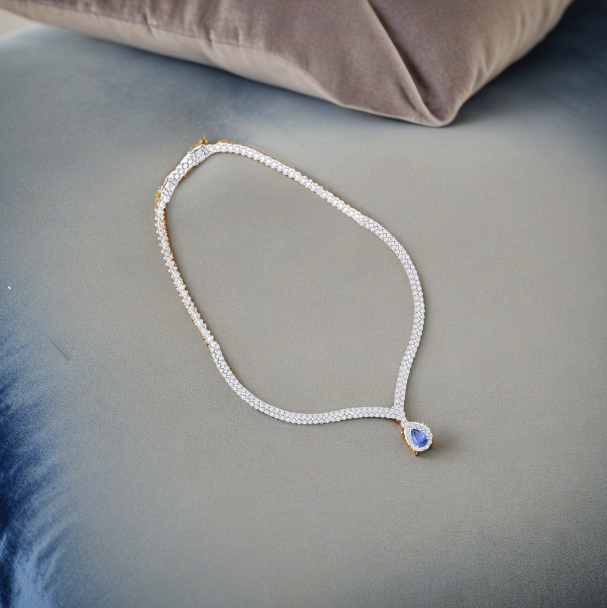

In [7]:
image_path = "Screenshot 2024-10-24 163523.png"
image = Image.open(image_path)
image

In [8]:
outputs = generator(image_path, points_per_batch = 256)

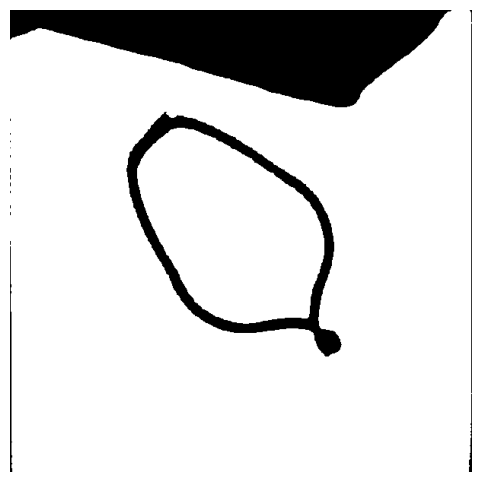

In [16]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image


# Extract the first mask from the list
first_mask = outputs['masks'][1]
# Plot the mask
plt.figure(figsize=(6,6))
plt.imshow(first_mask, cmap='gray')  # Use a gray colormap to visualize the mask
plt.axis('off')  # Hide the axes
# Save the mask as a JPG image
plt.savefig("mask_image6.jpg", format='jpg', bbox_inches='tight', pad_inches=0)
plt.show()

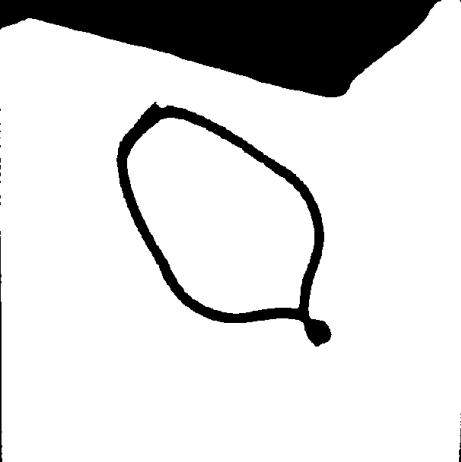

In [17]:
image_path = "mask_image6.jpg"
mask = Image.open(image_path)
mask

In [6]:
import torch
from diffusers import AutoPipelineForInpainting, AutoPipelineForImage2Image
from diffusers import AutoPipelineForImage2Image
import torch

# Load the pipeline with your desired settings
pipeline = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0", 
    torch_dtype=torch.float16, 
    variant="fp16"
)

# Move the pipeline to the third GPU (index 2 for the third GPU)
device = torch.device("cuda:2")
pipeline.to(device)

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

StableDiffusionXLImg2ImgPipeline {
  "_class_name": "StableDiffusionXLImg2ImgPipeline",
  "_diffusers_version": "0.31.0",
  "_name_or_path": "stabilityai/stable-diffusion-xl-refiner-1.0",
  "feature_extractor": [
    null,
    null
  ],
  "force_zeros_for_empty_prompt": false,
  "image_encoder": [
    null,
    null
  ],
  "requires_aesthetics_score": true,
  "scheduler": [
    "diffusers",
    "EulerDiscreteScheduler"
  ],
  "text_encoder": [
    null,
    null
  ],
  "text_encoder_2": [
    "transformers",
    "CLIPTextModelWithProjection"
  ],
  "tokenizer": [
    null,
    null
  ],
  "tokenizer_2": [
    "transformers",
    "CLIPTokenizer"
  ],
  "unet": [
    "diffusers",
    "UNet2DConditionModel"
  ],
  "vae": [
    "diffusers",
    "AutoencoderKL"
  ]
}

In [36]:
# Load the image-to-image pipeline (ensure the model supports inpainting)
# image_generator = pipeline("stable-diffusion-inpainting", model="stabilityai/stable-diffusion-xl-refiner-1.0")

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
# Ensure the images are PIL Images
init_image = Image.open("Screenshot 2024-10-24 163523.png").resize((1024, 1024))
mask_image = Image.open("mask_image2.jpg").resize((1024, 1024))

In [38]:
type(init_image)


PIL.Image.Image

In [42]:
mask_image.size

(1024, 1024)

In [ ]:

prompt= "Elegant still life of a diamond necklace resting on a rich blue velvet cushion. Soft, warm lighting emphasizes the necklace's sparkle and the cushion's luxurious texture. Simple, refined background with muted tones enhances focus on the jewelry, creating a sophisticated and timeless atmosphere."
image = pipeline(prompt=prompt, image=init_image, mask_image=mask_image).images[0]
image

  0%|          | 0/15 [00:00<?, ?it/s]

In [26]:
image_path = "diamond-butterfly.png"
original_image = Image.open(image_path).convert("RGBA")
resized_img, white_bg_image = scale_and_paste(original_image)

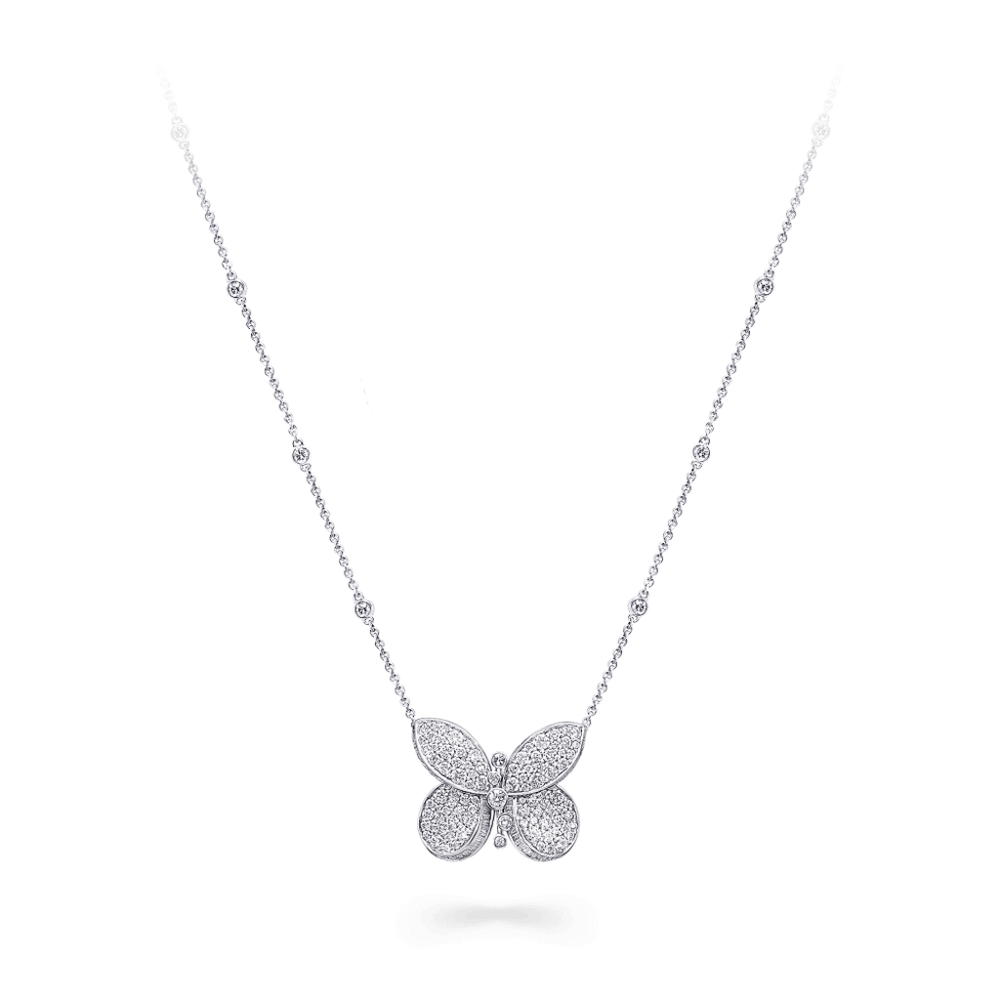

In [27]:
white_bg_image

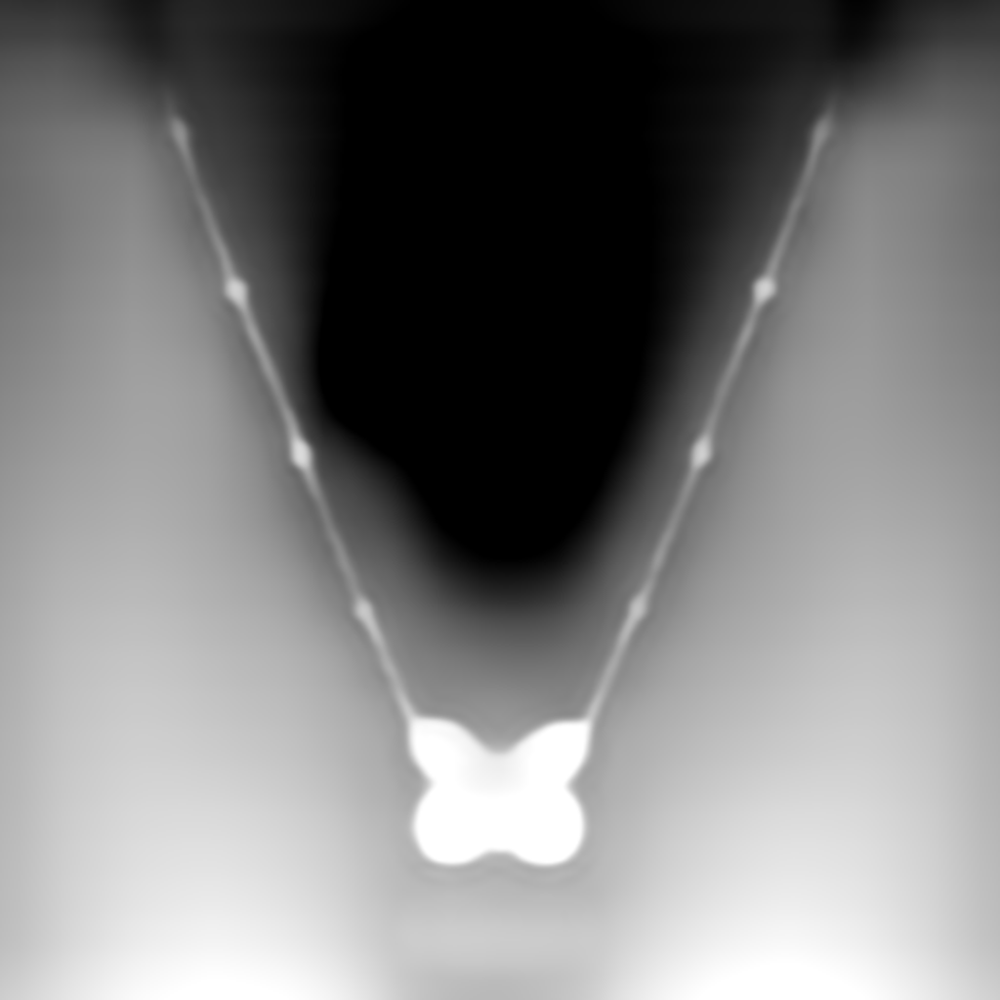

In [28]:
image_zoe = zoe(white_bg_image, detect_resolution=512, image_resolution=1024)
image_zoe

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["necklace's luxury against the woman ’ s skin."]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["necklace's luxury against the woman ’ s skin."]


  0%|          | 0/50 [00:00<?, ?it/s]

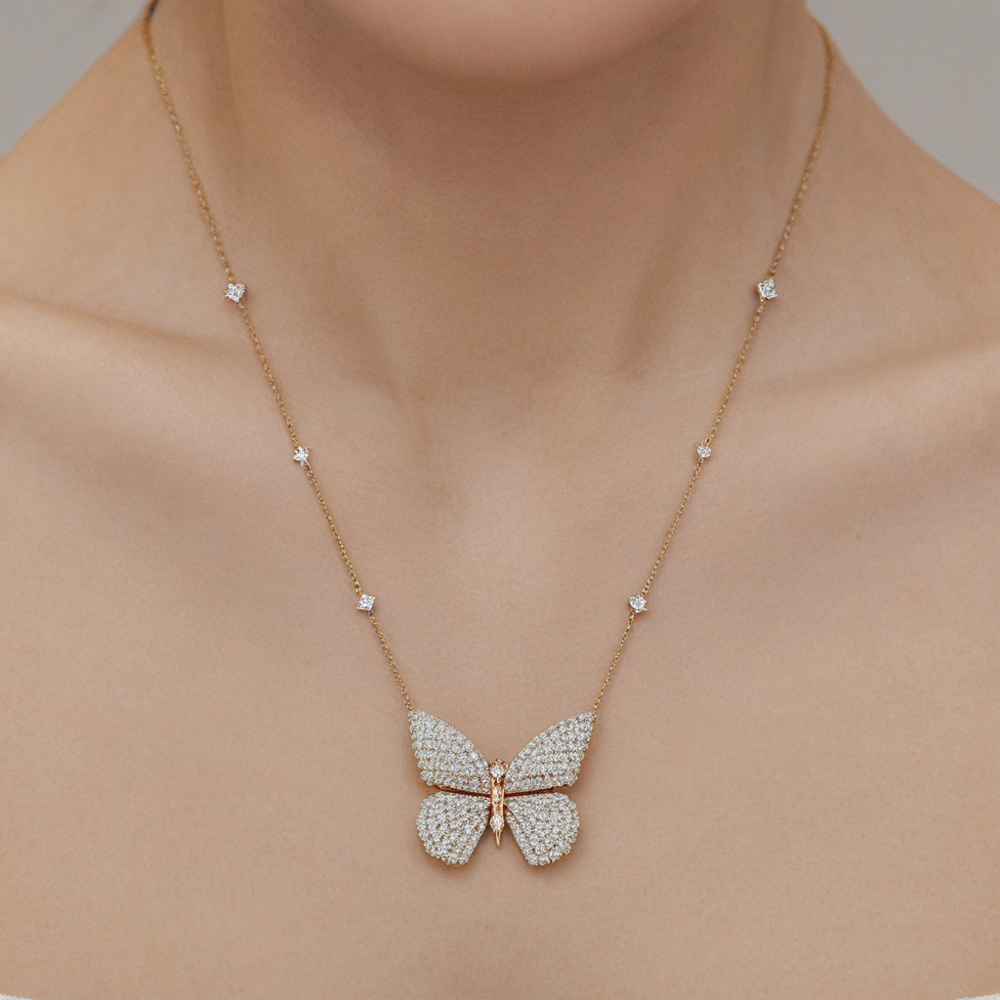

In [29]:
prompt=""" A high-resolution close-up photo of a diamond butterfly pendant necklace, elegantly worn around a woman’s neck. Only her neck and collarbone are visible, with a softly blurred, neutral background that keeps the focus on the jewelry. Warm, diffused lighting accentuates the pendant's sparkle and the elegance of the piece, while the minimalist composition highlights the necklace's luxury against the woman’s skin."""
negative_prompt = "Blurred image, overly bright lighting, cluttered or busy background, harsh shadows, reflections that obscure the pendant details, low resolution, dull colors, necklace lying flat, velvet or textured backgrounds, additional objects or props."

temp_image = generate_image(prompt, negative_prompt, white_bg_image, image_zoe)
temp_image

The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["minimalist composition highlights the necklace's luxury against the woman ’ s skin."]
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ["minimalist composition highlights the necklace's luxury against the woman ’ s skin."]


  0%|          | 0/50 [00:00<?, ?it/s]

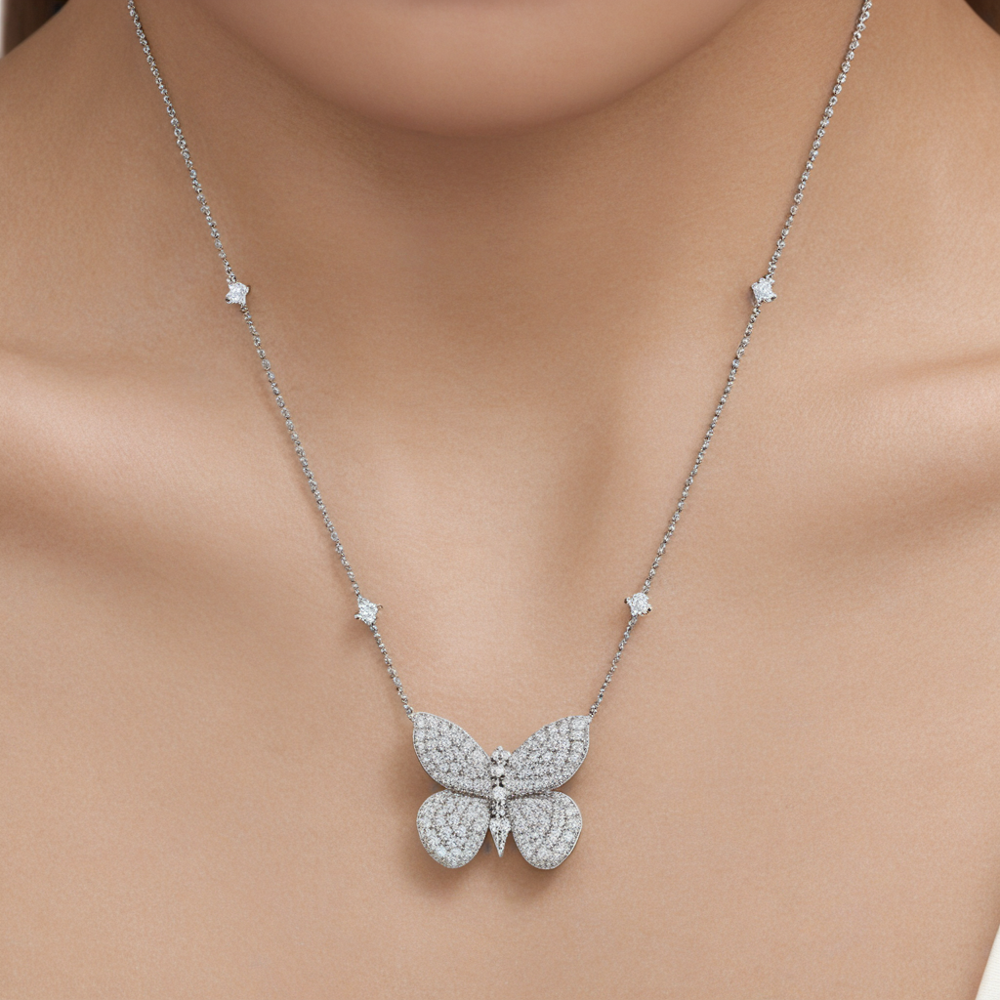

In [34]:
prompt=""" A high-resolution close-up photo of a diamond butterfly pendant with sliver necklace, elegantly worn around a woman’s neck. Only her neck and collarbone are visible, with a softly blurred, neutral background that keeps the focus on the jewelry. Warm, diffused lighting accentuates the pendant's sparkle and the elegance of the piece, while the minimalist composition highlights the necklace's luxury against the woman’s skin."""
negative_prompt = "Blurred image, overly bright lighting, cluttered or busy background, harsh shadows, reflections that obscure the pendant details, low resolution, dull colors, necklace lying flat, velvet or textured backgrounds, additional objects or props."

temp_image = generate_image(prompt, negative_prompt, white_bg_image, image_zoe)
temp_image

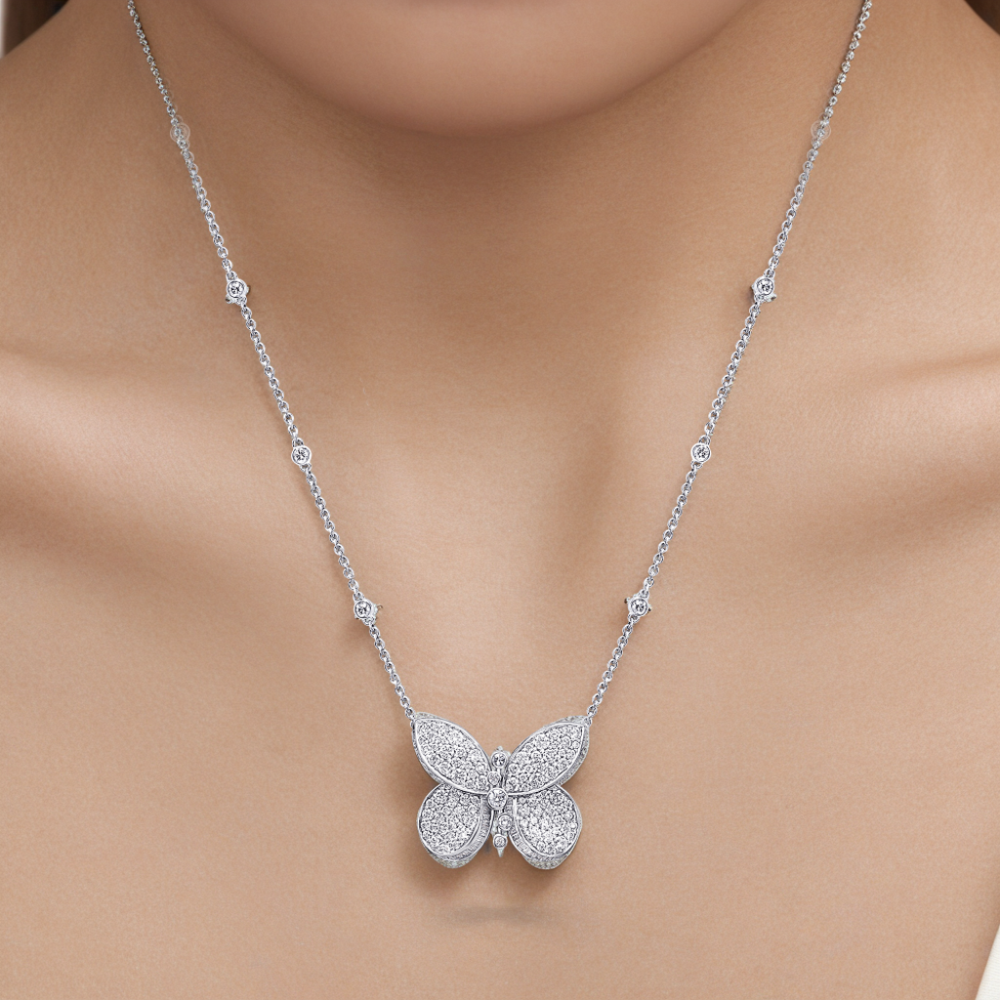

In [35]:
x = (1024 - resized_img.width) // 2
y = (1024 - resized_img.height) // 2
temp_image.paste(resized_img, (x, y), resized_img)
temp_image